In [1]:
import pandas as pd
import scanpy as sc
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
import matplotlib.ticker as mtick
from matplotlib.colors import LinearSegmentedColormap

import matplotlib

In [2]:
# set plot parameters
sc.set_figure_params(dpi=200)

def invert_list_dict(list_dict):
    inverted = {}
    [inverted.update(dict(zip(list_dict[value], 
                                  len(list_dict[value])*[value]))) for value in list_dict.keys()]
    return inverted

### Read the Lung data h5ad here!!!

In [6]:
#lung = sc.read('../../broad_data/scp/lung_final.h5ad')

### Names and ordering of cell types and compartments

In [32]:
subclusterComparment2types = {'Epithelial':
                                ['AT1',  'KRT8+ PATS/ADI/DATPs', 'AT2', 'Secretory', 'Mesothelial', 'Epithelial', 
                                 'Ciliated', ], 
                              'Stromal':
                                ['Proliferative fibroblast', 'Fibroblast', 'Myofibroblast', 'Pericytes/ Smooth Muscle'], 
                             'Endothelial':
                                 ['Lymphatic EC', 'Capillary 1', 'Capillary Aerocytes', 'Capillary 2', 'Mixed populations', 
                                  'Artery EC', 'Vein EC', 'doublets T+endothelial', 
                                  'doublets T+endothelial/macrophages',  ], 
                             'Lymphoid':
                                 ['NK cells', 'NK/NKT', 
                                  'CD8+ T cells', 'CD4+ T cells metabolically active', 'CD4+ Treg', 'Doublets CD4 T/ CD8 T/ NK cells',
                                  'B cells', 'Plasma cells PRDM1/BLIMP hi', 'Plasma cells PRDM1/BLIMP int',  'Plasmablasts',
                                  ], 
                            'Myeloid':
                                 ['Macrophage LDB2hi OSMRhi YAP1hi', 'Macrophage metabolically active', 
                                  'Macrophage PPARGhi CD5Lhi', 'Inflammatory monocytes CD14hiCD16hi', 
                                  'Macrophage CD163hi MERTKhi','Macrophage VCANhi FCN1hi', 
                                  'MAST', 'RBC'], 
                             'Other':
                                 ['Doublet']}

predictionCompartment2types = {'Epithelial':
                                ['AT1',  'AT2',   'club', 'basal', 'goblet', 'mesothelial', 'ciliated', 'neuroendocrine'], 
                              'Stromal':
                                ['fibroblast', 'myofibroblast', 'smc', 'pericyte'], 
                             'Endothelial':
                                 ['lymphatic endothelial', 'vascular endothelial'], 
                             'Lymphoid':
                                 ['NK cell', 'CD8+ T cell', 'Treg',
                                  'CD4+ T cell', 'nkt', 'B cell', 'plasma cell', 
                                   'pDC'],
                            'Myeloid':
                                 [  'macrophage', 'monocyte','cDC',
                                  'CD16+ monocyte','neutrophil', 'mast']
                              }

compartments = subclusterComparment2types.keys()
prediction_order = np.sum([predictionCompartment2types[compartment] for compartment in compartments if compartment in predictionCompartment2types.keys()])
subcluster_order = np.sum([subclusterComparment2types[compartment] for compartment in compartments])

SubCluster2Compartment = invert_list_dict(subclusterComparment2types)
prediction2Compartment = invert_list_dict(predictionCompartment2types)

/home/gheimber/.anaconda3/envs/dev/lib/python3.7/site-packages/numpy/core/fromnumeric.py:87: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


### get compartment ranges in snuc data

In [7]:
donor_compartments = lung.obs[lung.obs.method=='nuclei'].groupby(['donor', 'compartment']).size().unstack()

# Figure 2a

/home/gheimber/.anaconda3/envs/dev/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


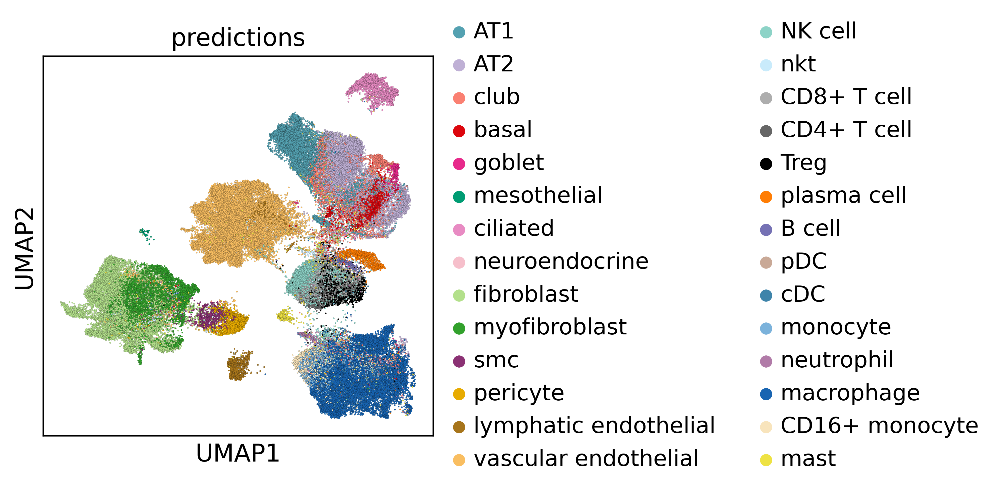

In [8]:
sc.pl.umap(lung, color='predictions', 
           edgecolor='k', linewidth=.035, size=3,) 

### Figure ED2I

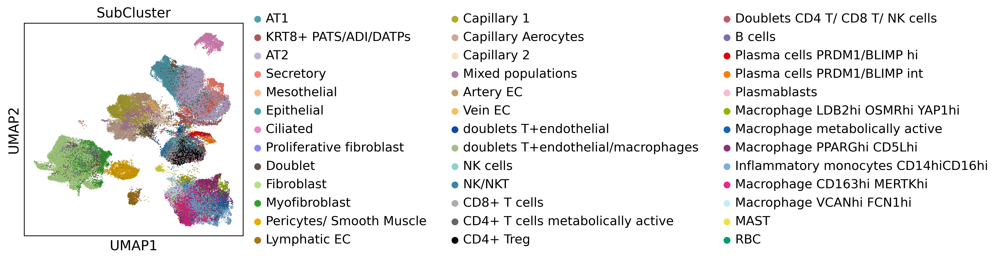

In [9]:
sc.pl.umap(lung, color='SubCluster', edgecolor='k', linewidth=.035, size=3, )

### Figure ED2E

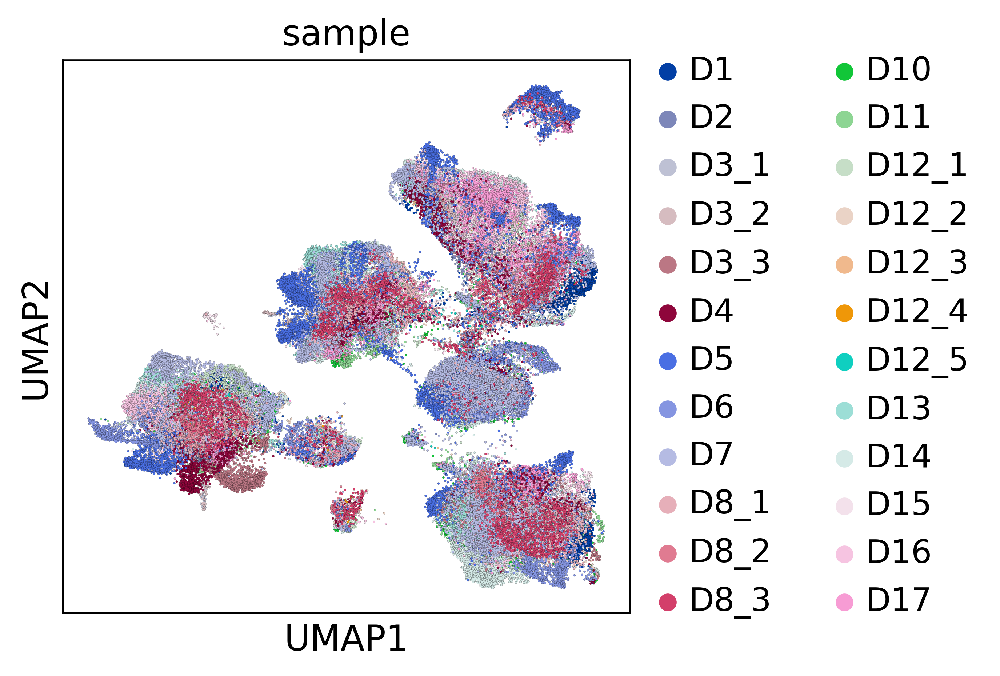

In [10]:
sc.pl.umap(lung, color='sample', edgecolor='k', linewidth=.035, size=3)

### Fig ED2F,G

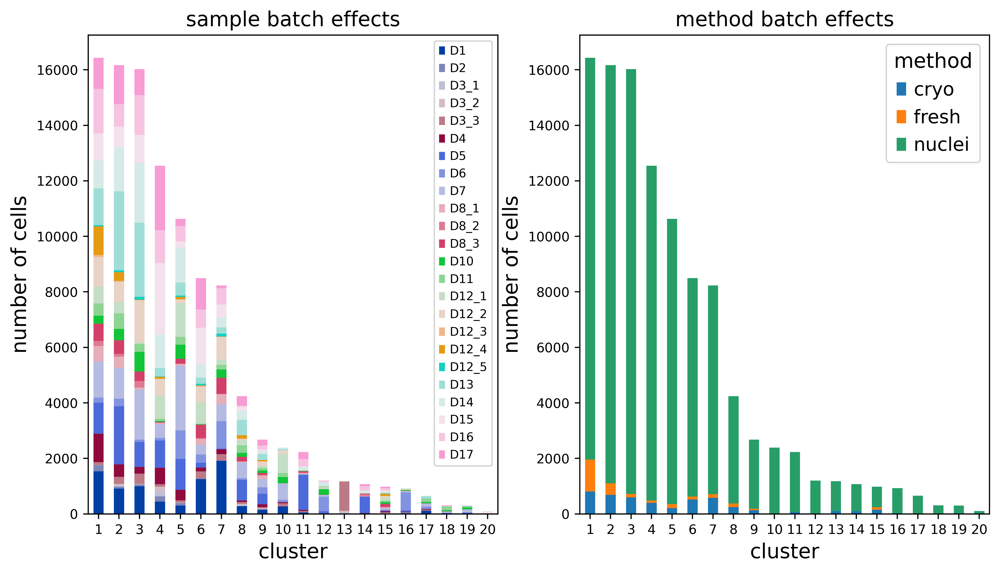

In [11]:
method_cluster_wide = lung.obs[['method', 'leiden_res_1.3']].groupby(['method', 'leiden_res_1.3']).size().unstack().T
sample_cluster_wide = lung.obs[['sample', 'leiden_res_1.3']].groupby(['sample', 'leiden_res_1.3']).size().unstack().T

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(11,6))


sample_cluster_wide.plot(kind='bar', 
                        stacked=True,
                        title="sample batch effects",
                        xlabel='cluster',
                        ylabel='number of cells',
                        grid=False,
                        sort_columns=True,
                        ax=axes[0], 
                        cmap=LinearSegmentedColormap.from_list('my_colormap', lung.uns['sample_colors']))
axes[0].legend(fontsize='xx-small')

method_cluster_wide.plot(kind='bar', 
                        stacked=True,
                        title="method batch effects",
                        xlabel='cluster',
                        ylabel='number of cells',
                        grid=False,
                        sort_columns=True, 
                        ax=axes[1])

axes[0].tick_params(labelrotation=0, labelsize=9)
axes[1].tick_params(labelrotation=0, labelsize=9)


### Fig ED3C

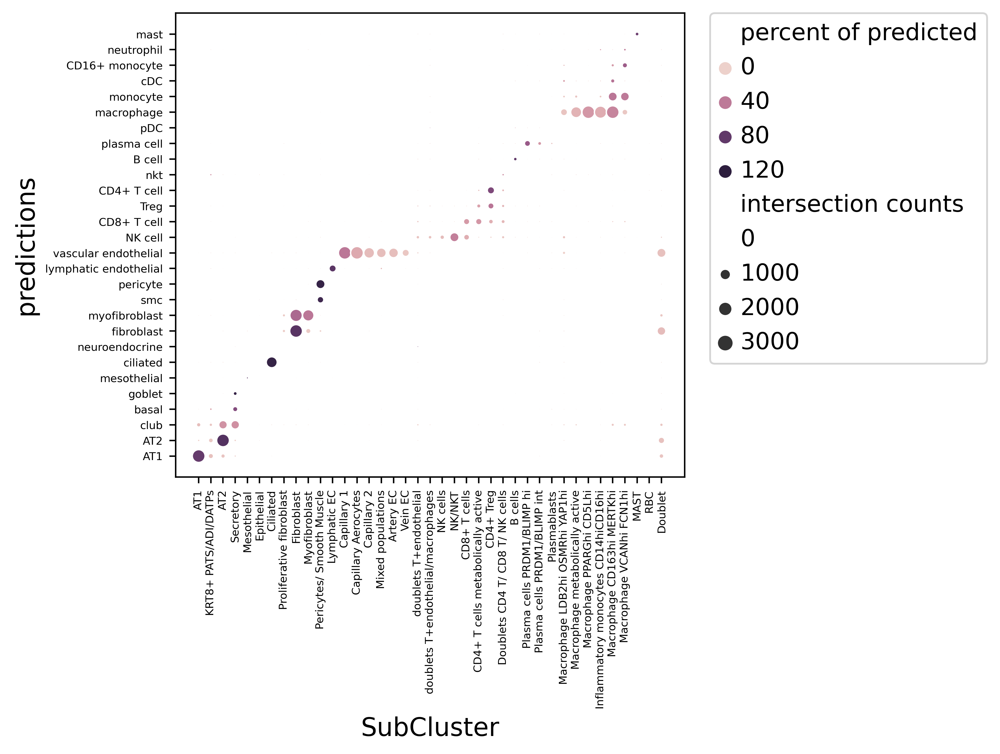

In [31]:
cmap = sns.cubehelix_palette(start=45.5, light=1, rot=.1, n_colors=20)

counts = pd.crosstab(lung.obs['predictions'], lung.obs['SubCluster']).T
comparison = 100*(counts/counts.sum(axis=0)).T

counts_long = counts.T.loc[prediction_order,subcluster_order].unstack().reset_index()
comparison_long = comparison.loc[prediction_order,subcluster_order].unstack().reset_index()

long = counts_long.merge(comparison_long, on=['SubCluster', 'predictions'])
long.columns = ['SubCluster', 'predictions','intersection counts',  'percent of predicted']

predict2int = {label:i for i,label in enumerate(prediction_order)}
SubCluster2int = {label:i for i,label in enumerate(subcluster_order)}

long.predictions = long.predictions.map(predict2int)
long.SubCluster = long.SubCluster.map(SubCluster2int)

plt.figure(figsize=(8,6))
cmap = sns.cubehelix_palette(start=45.5, light=1, rot=.1, n_colors=20)
ax = sns.scatterplot(data=long, 
                     x='SubCluster', 
                     y='predictions', 
                     hue='percent of predicted', 
                     size='intersection counts', 
                     cmap=cmap, 
                     sizes=(0,50), 
                     hue_norm=(0,100), 
                     size_norm=(0,3000))#, linewidth=.25, edgecolor=[.5, .5, .5])
plt.grid(False)
ax.set_xticks(range(len(subcluster_order)))
ax.set_xticklabels(subcluster_order)
plt.xticks(rotation=90, ha='center', fontsize=6);
ax.set_yticks(range(len(prediction_order)))
ax.set_yticklabels(prediction_order)
plt.yticks(fontsize=6)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.);
plt.tight_layout()

### Figure ED5b

In [56]:
def get_type_counts(obs, field='compartment', method='nuclei'):
    obs = obs[~obs.predictions.isnull()]
    counts = obs.groupby(['method', 'donor', field], observed=True).size().reset_index()
    totals = obs.groupby(['method', 'donor'], observed=True).size().reset_index()
    counts = counts.rename(columns={0:'cell_counts'})
    totals = totals.rename(columns={0:'sample_total'})
    counts = counts.merge(totals, on=['method', 'donor'])
    counts['percentage'] = 100*counts['cell_counts']/counts['sample_total']
    
    if method:
        counts = counts[(counts.method==method) & (counts[field]!='nan')]
        counts[field] = counts[field].cat.remove_unused_categories()
        type_order = counts.groupby(field).median().sort_values('percentage').index
        
    order = counts.groupby(field)['percentage'].max().sort_values().index
    return counts.sort_values('percentage'),order

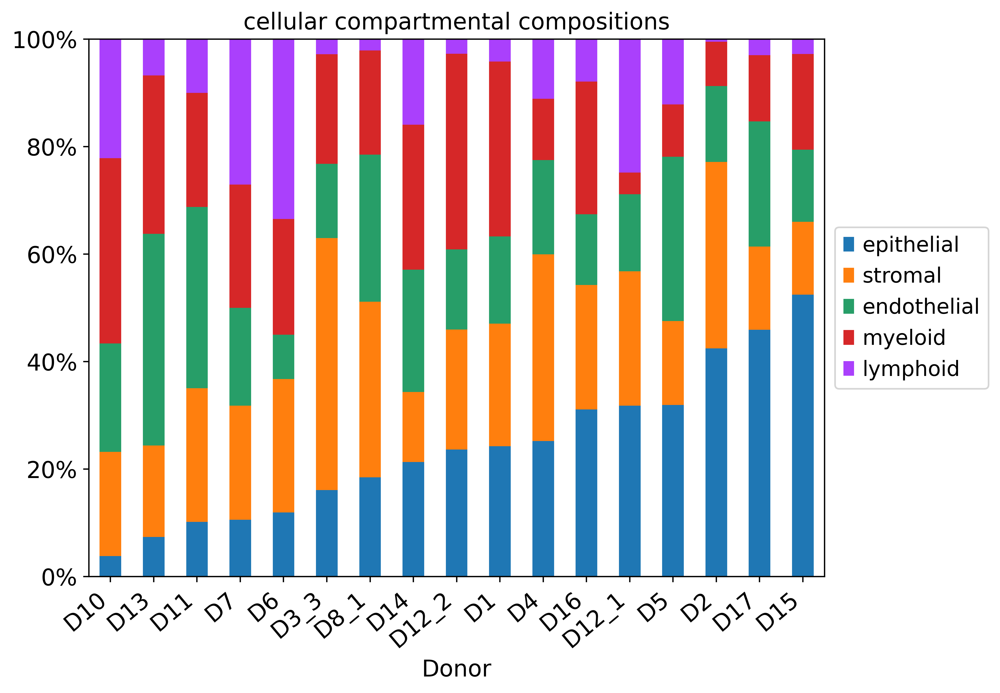

In [57]:
field = 'compartment'
nuclei_counts,order = get_type_counts(lung.obs, field=field, method='nuclei')
nuclei_counts['compartment'] = nuclei_counts['compartment'].cat.reorder_categories(['epithelial', 'stromal', 'endothelial',  'myeloid','lymphoid'])
nuclei_counts_wide = nuclei_counts[['donor', 'compartment', 'percentage']].pivot(index='donor', columns='compartment')
nuclei_counts_wide.columns = nuclei_counts_wide.columns.droplevel(0)
nuclei_counts_wide = nuclei_counts_wide.sort_values('epithelial')
ax = nuclei_counts_wide.plot(kind='bar', 
                        stacked=True,
                        title="cellular compartmental compositions",
                        xlabel='Donor',
                        ylabel=None,
                        ylim=[0,100],
                        figsize=[8,6], 
                        grid=False,
                        sort_columns=True, # use if donor names are ordered
                       )
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
plt.xticks(rotation=40, ha='right');
fmt = '%.0f%%' # Format you want the ticks, e.g. '40%'
yticks = mtick.FormatStrFormatter(fmt)
ax.yaxis.set_major_formatter(yticks)


### Fig ED5a

/home/gheimber/.anaconda3/envs/dev/lib/python3.7/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


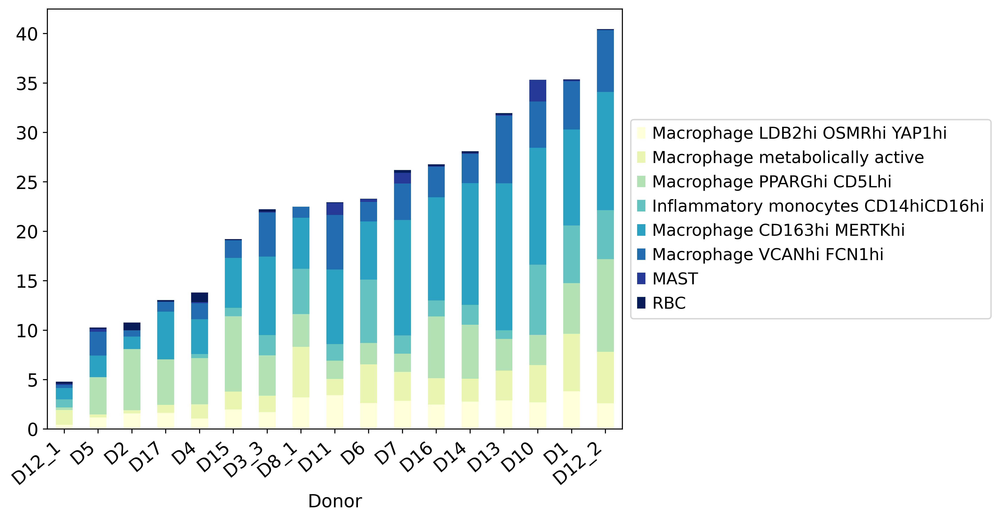

In [58]:
myeloid_subclusters = subclusterComparment2types['Myeloid']
nuclei_subcluster,order = get_type_counts(lung.obs, field='SubCluster', method='nuclei')
myeloid_subcluster = nuclei_subcluster[nuclei_subcluster.SubCluster.isin(myeloid_subclusters)]
myeloid_subcluster['SubCluster'] = myeloid_subcluster['SubCluster'].cat.remove_unused_categories()
myeloid_subcluster_wide = myeloid_subcluster[['donor', 'SubCluster', 'percentage']].pivot(index='donor', columns='SubCluster')
myeloid_subcluster_wide.columns = myeloid_subcluster_wide.columns.droplevel(0)
myeloid_subcluster_wide = myeloid_subcluster_wide.loc[myeloid_subcluster_wide.fillna(0).sum(axis=1).sort_values().index]
ax = myeloid_subcluster_wide.plot(kind='bar', 
                        stacked=True,
                        cmap='YlGnBu',
                        xlabel='Donor',
                        figsize=[8,6], 
                        grid=False,
                        sort_columns=True,
                       )
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
plt.xticks(rotation=40, ha='right');
fmt = '%.0f%%'
yticks = mtick.FormatStrFormatter(fmt)